In [1]:
# Load required tools. 'as' shorthands tools name for convenience.
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import bbknn
from pandas.core.index import RangeIndex
from matplotlib import rcParams
from matplotlib.pyplot import rc_context

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  if __name__ == '__main__':


In [2]:
sc.settings.verbosity = 3   
sc.logging.print_header() 
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


In [3]:
!pwd

/home/harris/VE2hrAmpIsth


In [4]:
VE2AmIs_AllPops = sc.read( './VE2AmIs_AllPops.h5ad') 

# Loading the data file or previously saved file as 'adata'. Does not have to be called adata can be named anything.
VE2AmIs = sc.read( './VE2AmIs.h5ad') 

In [5]:
VE2AmIs_AllPops_batchcorrected = bbknn.bbknn(VE2AmIs_AllPops, batch_key='Region', copy=True)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


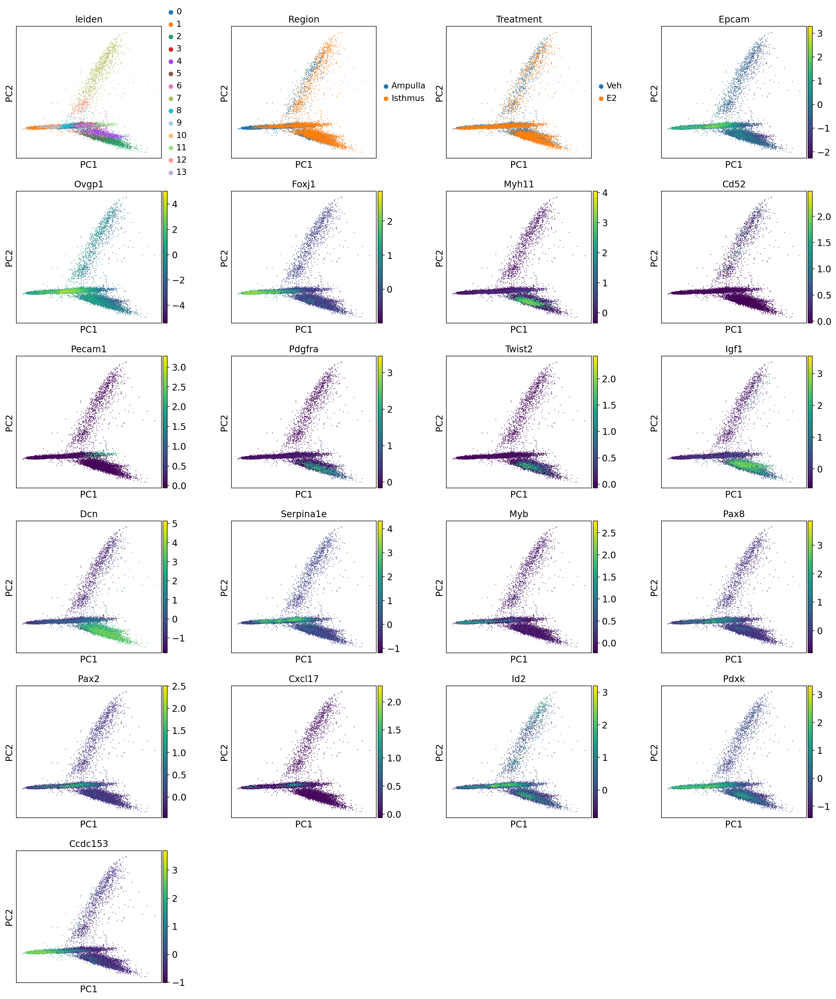

In [6]:
sc.pl.pca(VE2AmIs_AllPops_batchcorrected, wspace=0.35,
          color=['leiden', 'Region', 'Treatment', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 
                 
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2', 'Cxcl17', 'Id2', 'Pdxk', 'Ccdc153'])

In [7]:
sc.tl.umap(VE2AmIs_AllPops_batchcorrected)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


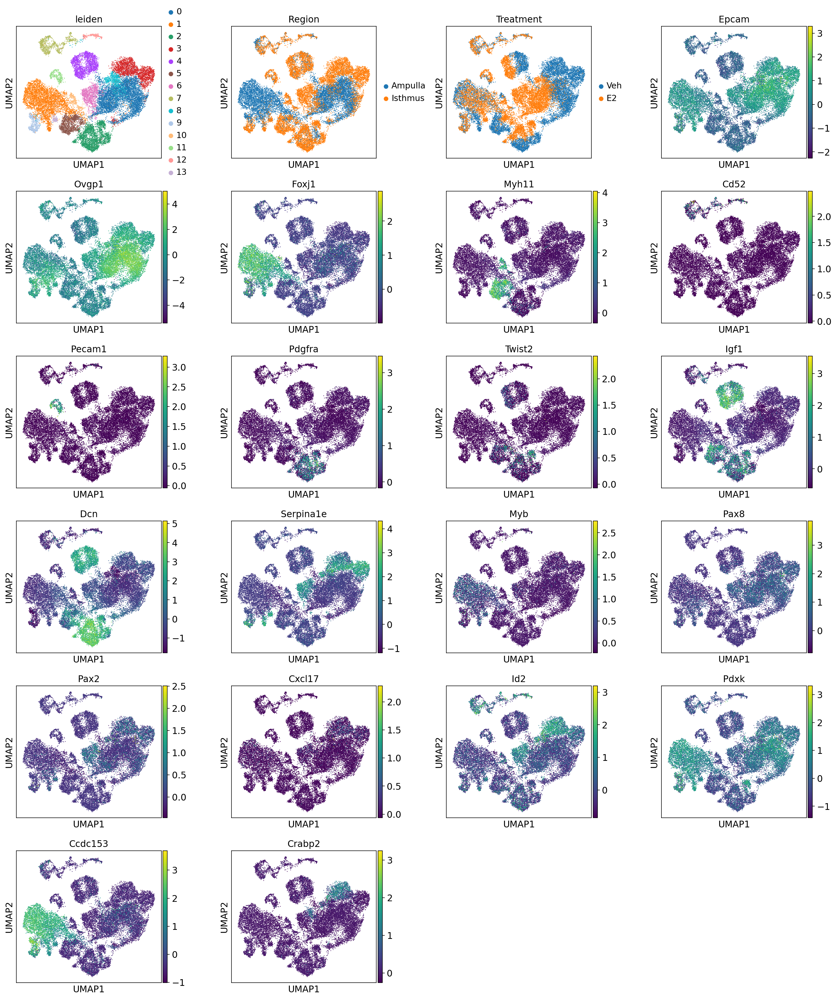

In [8]:
sc.pl.umap(VE2AmIs_AllPops_batchcorrected, wspace=0.35, 
           color=['leiden', 'Region', 'Treatment', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2', 'Cxcl17', 'Id2', 'Pdxk', 'Ccdc153', 'Crabp2'])

In [9]:
marker_genes = ['Epcam', 'Krt8','Krt19','Vim','Pdgfra','Twist2', 'Sprr2f',
                'Acta2', 'Myh11','Foxj1', 'Ccdc153', 'Ovgp1','Wt1','Serpina1e',
                'S100g','Pecam1', 'Cd52', 'Ptprc', 'Pgr', 'Esr1', 'Crabp2'
                 ]

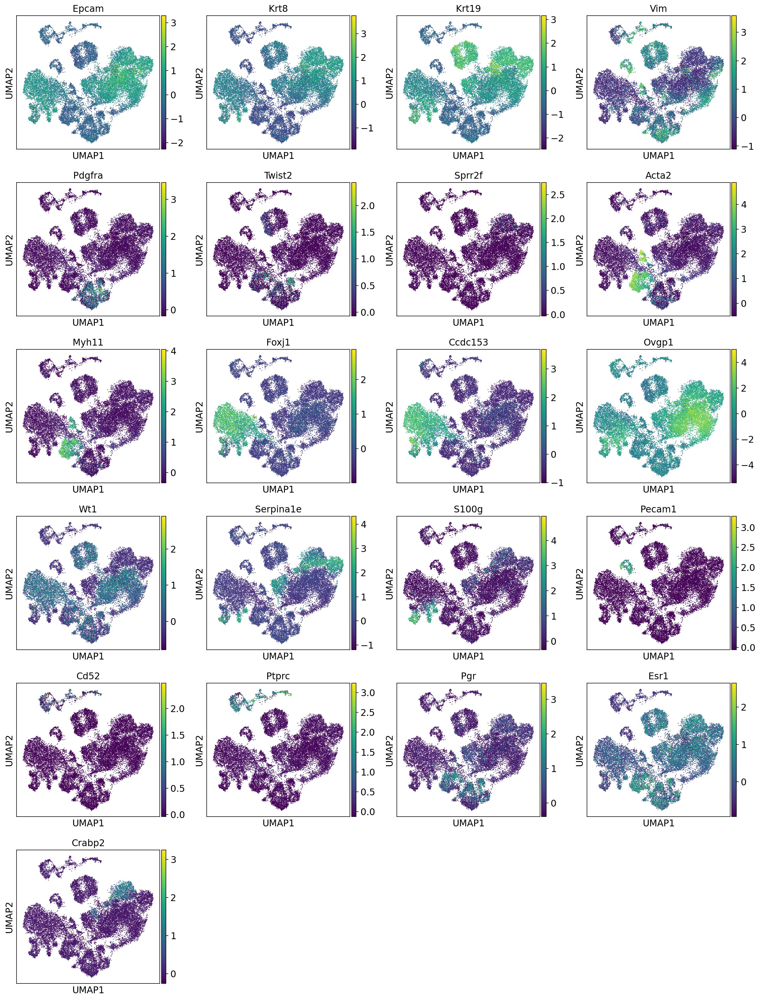

In [10]:
sc.pl.umap(VE2AmIs_AllPops_batchcorrected, color=marker_genes)

In [11]:
VE2AmIs_AllPops_batchcorrected.obs.groupby(["leiden","Treatment","Region"]).apply(len)

leiden  Treatment  Region 
0       Veh        Ampulla    2983
                   Isthmus     423
        E2         Ampulla    2343
                   Isthmus     298
1       Veh        Ampulla    2368
                   Isthmus     165
        E2         Ampulla    1815
                   Isthmus      26
2       Veh        Ampulla     143
                   Isthmus    1225
        E2         Ampulla     261
                   Isthmus    1021
3       Veh        Ampulla      18
                   Isthmus    2452
        E2         Isthmus       2
4       Veh        Ampulla     286
                   Isthmus     781
        E2         Ampulla     156
                   Isthmus     796
5       Veh        Ampulla      53
                   Isthmus     932
        E2         Ampulla     210
                   Isthmus     191
6       E2         Ampulla      11
                   Isthmus    1133
7       Veh        Ampulla     140
                   Isthmus     324
        E2         Ampulla  

In [12]:
new_cluster_names = [
     '0 Secretory_InfAmp',
     '1 Ciliated_InfAmp',
    '2 Fibroblast_Pdgfra+',
    '3 Secretory_IsthUTJ_1',
    '4 Fibroblast_Pdgfra-',
    '5 Muscle_1',
    '6 Secretory_IsthUTJ_2',
    '7 Immune_1',
    '8 Secretory_IsthUTJ_3',
    '9 Ciliated_IsthUTJ_1',
    '10 Muscle_2',
    '11 Endothelial',
    '12 Immune_2',
    '13 Ciliated_IsthUTJ_2',
]
VE2AmIs_AllPops_batchcorrected.rename_categories('leiden', new_cluster_names)

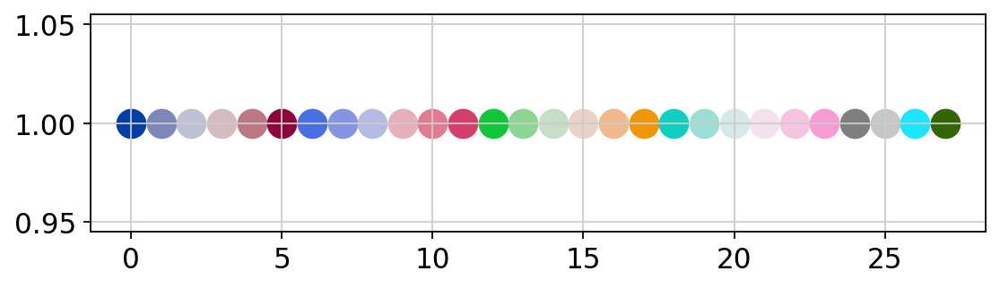

In [13]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [14]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE2AmIs_AllPops_batchcorrected.uns['leiden_colors'])

In [15]:
new_colors[[0]] = zeileis_colors[[6]]  
new_colors[[1]] = zeileis_colors[[5]]
new_colors[[2]] = zeileis_colors[[16]]  
new_colors[[3]] = zeileis_colors[[11]]  
new_colors[[4]] = zeileis_colors[[17]]  
new_colors[[5]] = zeileis_colors[[2]]  
new_colors[[6]] = zeileis_colors[[10]]  
new_colors[[7]] = zeileis_colors[[12]]  
new_colors[[8]] = zeileis_colors[[9]]  
new_colors[[9]] = zeileis_colors[[1]]  
new_colors[[10]] = zeileis_colors[[0]]  
new_colors[[11]] = zeileis_colors[[18]]  
new_colors[[12]] = zeileis_colors[[13]]  
new_colors[[13]] = zeileis_colors[[4]]  

In [16]:
VE2AmIs_AllPops_batchcorrected.uns['leiden_colors'] = new_colors

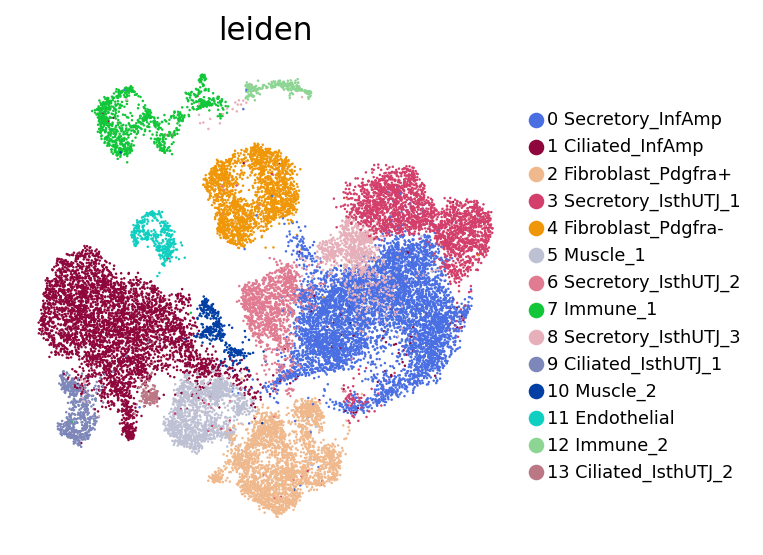

In [17]:
sc.pl.umap(VE2AmIs_AllPops_batchcorrected, color='leiden', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, save='Veh_E2_2h_Leiden_AllPops.pdf')

In [18]:
new_cluster_names = [
    'Veh',
    'E2'
]
VE2AmIs_AllPops_batchcorrected.rename_categories('Treatment', new_cluster_names)

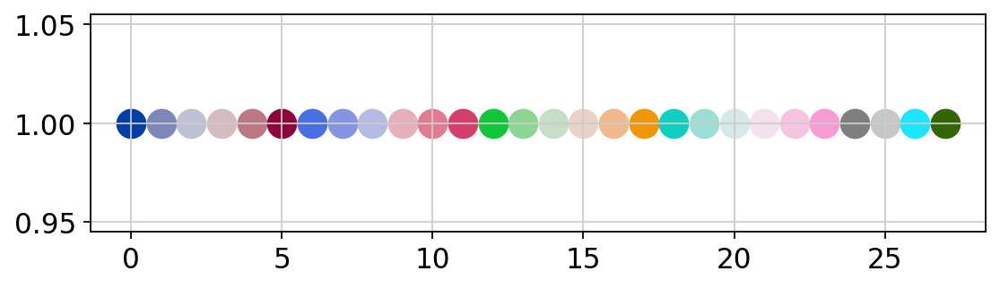

In [19]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [20]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE2AmIs_AllPops_batchcorrected.uns['Treatment_colors'])

In [21]:
new_colors[[0]] = zeileis_colors[[6]]  #0 Veh
new_colors[[1]] = zeileis_colors[[11]]  #1 E2

In [22]:
VE2AmIs_AllPops_batchcorrected.uns['Treatment_colors'] = new_colors

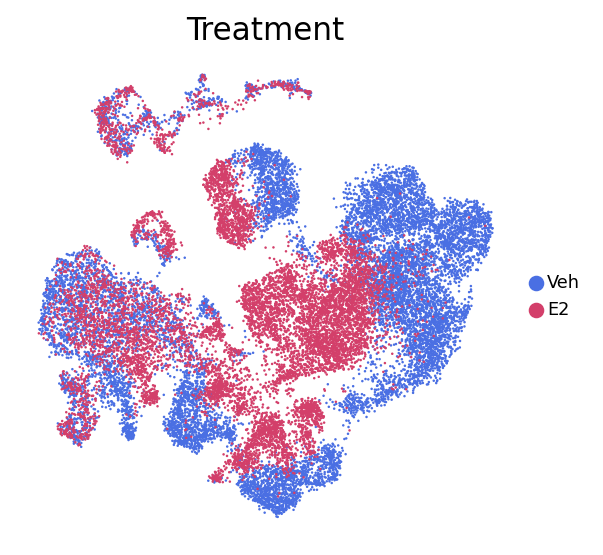

In [23]:
sc.pl.umap(VE2AmIs_AllPops_batchcorrected, color='Treatment', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, save='Veh_E2_2h_AllPops_Treatment.pdf')

In [24]:
new_cluster_names = [
    'InfAmp',
    'IsthUTJ'
]
VE2AmIs_AllPops_batchcorrected.rename_categories('Region', new_cluster_names)

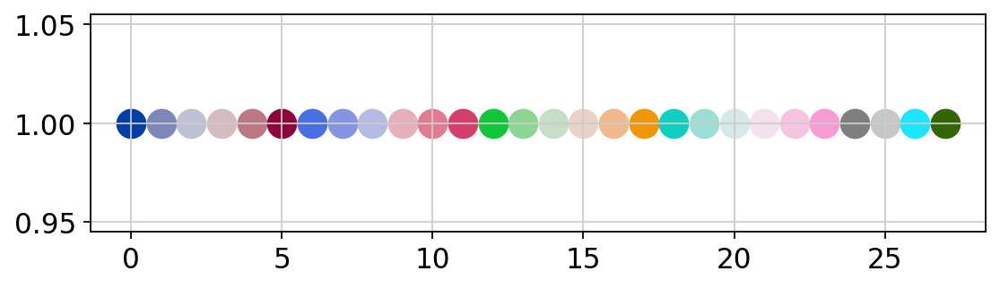

In [25]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [26]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE2AmIs_AllPops_batchcorrected.uns['Region_colors'])

In [27]:
new_colors[[0]] = zeileis_colors[[9]]  #0 InfAmp
new_colors[[1]] = zeileis_colors[0]  #1 IsthUTJ

In [28]:
VE2AmIs_AllPops_batchcorrected.uns['Region_colors'] = new_colors

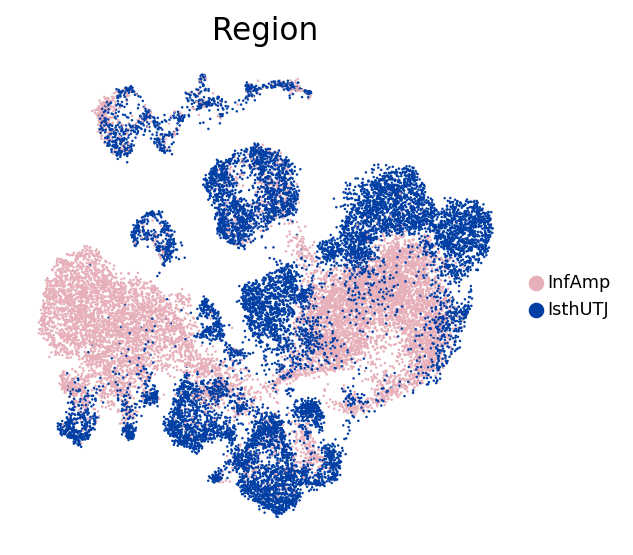

In [29]:
sc.pl.umap(VE2AmIs_AllPops_batchcorrected, color='Region', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, save='Veh_E2_2h_AllPops_Region.pdf')